# Step 1: Importing Libraries and  Data Gathering

In [1]:
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
plt.style.use('ggplot')
from matplotlib.pyplot import figure

%matplotlib inline
matplotlib.rcParams['figure.figsize']=(12,8)


In [2]:
# Reading the csv file:

# If the file is in another drive you can paste the location of the file and add a r in front of it to remove the unicode error as shown below
# or you can replace all the '\' with '/'.

df=pd.read_csv(r'C:\Users\HP\Downloads\movies.csv')
#df=pd.read_csv('C:/Users/HP/Downloads/movies.csv')

pd.set_option('display.max_rows',None) # to see all the rows of the dataframe.

df

,budget,company,country,director,genre,gross,name,rating,released,runtime,score,star,votes,writer,year
0,8000000.0,Columbia Pictures Corporation,USA,Rob Reiner,Adventure,52287414.0,Stand by Me,R,1986-08-22,89,8.1,Wil Wheaton,299174,Stephen King,1986
1,6000000.0,Paramount Pictures,USA,John Hughes,Comedy,70136369.0,Ferris Bueller's Day Off,PG-13,1986-06-11,103,7.8,Matthew Broderick,264740,John Hughes,1986
2,15000000.0,Paramount Pictures,USA,Tony Scott,Action,179800601.0,Top Gun,PG,1986-05-16,110,6.9,Tom Cruise,236909,Jim Cash,1986
3,18500000.0,Twentieth Century Fox Film Corporation,USA,James Cameron,Action,85160248.0,Aliens,R,1986-07-18,137,8.4,Sigourney Weaver,540152,James Cameron,1986
4,9000000.0,Walt Disney Pictures,USA,Randal Kleiser,Adventure,18564613.0,Flight of the Navigator,PG,1986-08-01,90,6.9,Joey Cramer,36636,Mark H. Baker,1986
5,6000000.0,Hemdale,UK,Oliver Stone,Drama,138530565.0,Platoon,R,1987-02-06,120,8.1,Charlie Sheen,317585,Oliver Stone,1986
6,25000000.0,Henson Associates (HA),UK,Jim Henson,Adventure,12729917.0,Labyrinth,PG,1986-06-27,101,7.4,David Bowie,102879,Dennis Lee,1986
7,6000000.0,De Laurentiis Entertainment Group (DEG),USA,David Lynch,Drama,8551228.0,Blue Velvet,R,1986-10-23,120,7.8,Isabella Rossellini,146768,David Lynch,1986
8,9000000.0,Paramount Pictures,USA,Howard Deutch,Comedy,40471663.0,Pretty in Pink,PG-13,1986-02-28,96,6.8,Molly Ringwald,60565,John Hughes,1986
9,15000000.0,SLM Production Group,USA,David Cronenberg,Drama,40456565.0,The Fly,R,1986-08-15,96,7.5,Jeff Goldblum,129698,George Langelaan,1986


In [3]:
df.head(3)

,budget,company,country,director,genre,gross,name,rating,released,runtime,score,star,votes,writer,year
0,8000000.0,Columbia Pictures Corporation,USA,Rob Reiner,Adventure,52287414.0,Stand by Me,R,1986-08-22,89,8.1,Wil Wheaton,299174,Stephen King,1986
1,6000000.0,Paramount Pictures,USA,John Hughes,Comedy,70136369.0,Ferris Bueller's Day Off,PG-13,1986-06-11,103,7.8,Matthew Broderick,264740,John Hughes,1986
2,15000000.0,Paramount Pictures,USA,Tony Scott,Action,179800601.0,Top Gun,PG,1986-05-16,110,6.9,Tom Cruise,236909,Jim Cash,1986


In [4]:
df.shape

(6820, 15)

In [5]:
df.columns

Index(['budget', 'company', 'country', 'director', 'genre', 'gross', 'name',
       'rating', 'released', 'runtime', 'score', 'star', 'votes', 'writer',
       'year'],
      dtype='object')

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6820 entries, 0 to 6819
Data columns (total 15 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   budget    6820 non-null   float64
 1   company   6820 non-null   object 
 2   country   6820 non-null   object 
 3   director  6820 non-null   object 
 4   genre     6820 non-null   object 
 5   gross     6820 non-null   float64
 6   name      6820 non-null   object 
 7   rating    6820 non-null   object 
 8   released  6820 non-null   object 
 9   runtime   6820 non-null   int64  
 10  score     6820 non-null   float64
 11  star      6820 non-null   object 
 12  votes     6820 non-null   int64  
 13  writer    6820 non-null   object 
 14  year      6820 non-null   int64  
dtypes: float64(3), int64(3), object(9)
memory usage: 799.3+ KB


# Step 2: Check for missing data and Handling it.

In [7]:
df.isnull().sum()

budget      0
company     0
country     0
director    0
genre       0
gross       0
name        0
rating      0
released    0
runtime     0
score       0
star        0
votes       0
writer      0
year        0
dtype: int64

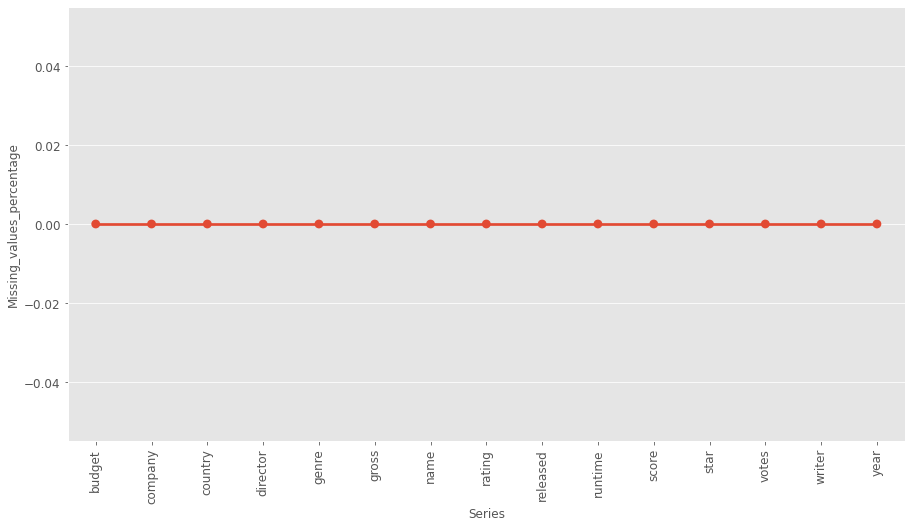

In [8]:
def missing_val_percent():
    missing_values=df.isnull().sum()
    rows_no=df.shape[0]
    mv_percent=missing_values*100/rows_no # Gives a series with each column names as row label(index) and the percentage as values
    mv_df=pd.DataFrame(mv_percent).reset_index() # Creates a dataframe with 2 series- index(due to reset_index()) and percentage
    #values for graph plotting
    mv_df=mv_df.rename(columns={'index':'Series',0:'Missing_values_percentage'}) # Here 0 is not written in quotes as it is not in text format.
    plt.figure(figsize=(15,8)) # This has to be given before the command to plot, otherwise it won't work.
    sns.pointplot(x='Series',y='Missing_values_percentage',data=mv_df)
    plt.xticks(rotation=90,fontsize=12)
    plt.yticks(fontsize=12)
    
    
missing_val_percent()


## <font color= green; text-size=20>No Missing values are there.</font>

# Step 3: Data Cleaning

   ### Changing the datatype of series 'budget' and 'gross' from float to int as the decimal points are not necessary there, it seems.

In [9]:
df['budget']=df['budget'].astype('int64')
df['gross']=df['gross'].astype('int64')

### The 'year' of release and the year in 'released' date do not match everywhere, so we can create a new column with the year extracted from the release date.
### For that, first we will change the dtype of 'released' from object to string to pull out data from it.

In [10]:
df['released']=df['released'].astype('string')

In [11]:
df['release_year']=df['released'].str[:4]

### To arrange the values as per the 'gross' in descending order

In [12]:
df.sort_values(by=['gross'], inplace=False, ascending=False)

,budget,company,country,director,genre,gross,name,rating,released,runtime,score,star,votes,writer,year,release_year
6380,245000000,Lucasfilm,USA,J.J. Abrams,Action,936662225,Star Wars: The Force Awakens,PG-13,2015-12-18,136,8.1,Daisy Ridley,687192,Lawrence Kasdan,2015,2015
5061,237000000,Twentieth Century Fox Film Corporation,UK,James Cameron,Action,760507625,Avatar,PG-13,2009-12-18,162,7.8,Sam Worthington,954412,James Cameron,2009,2009
2420,200000000,Twentieth Century Fox Film Corporation,USA,James Cameron,Drama,658672302,Titanic,PG-13,1997-12-19,194,7.8,Leonardo DiCaprio,862554,James Cameron,1997,1997
6391,150000000,Universal Pictures,USA,Colin Trevorrow,Action,652270625,Jurassic World,PG-13,2015-06-12,124,7.0,Chris Pratt,469200,Rick Jaffa,2015,2015
5723,220000000,Marvel Studios,USA,Joss Whedon,Action,623357910,The Avengers,PG-13,2012-05-04,143,8.1,Robert Downey Jr.,1064633,Joss Whedon,2012,2012
4840,185000000,Warner Bros.,USA,Christopher Nolan,Action,534858444,The Dark Knight,PG-13,2008-07-18,152,9.0,Christian Bale,1839571,Jonathan Nolan,2008,2008
6614,200000000,Lucasfilm,USA,Gareth Edwards,Action,532177324,Rogue One,PG-13,2016-12-16,133,7.9,Felicity Jones,365473,Chris Weitz,2016,2016
6687,200000000,Pixar Animation Studios,USA,Andrew Stanton,Animation,486295561,Finding Dory,PG,2016-06-17,97,7.4,Ellen DeGeneres,173005,Andrew Stanton,2016,2016
2870,115000000,Lucasfilm,USA,George Lucas,Action,474544677,Star Wars: Episode I - The Phantom Menace,PG,1999-05-19,136,6.5,Ewan McGregor,584809,George Lucas,1999,1999
6398,250000000,Marvel Studios,USA,Joss Whedon,Action,459005868,Avengers: Age of Ultron,PG-13,2015-05-01,141,7.4,Robert Downey Jr.,537832,Joss Whedon,2015,2015


### Checking for any duplicate values- Here, all features can occur for multiple films, including the film name, so there is no much point in checking the duplicate values.

# Step 3) Gathering Insights - EDA- What all affects the gross income of a movie?

### Let's start by checking the correlation between the various numerical features in the dataset.

In [13]:
df.corr(method='pearson') # by default method is 'pearson'. We can also see the values by 'kendall' and 'spearman' by changing the method.

,budget,gross,runtime,score,votes,year
budget,1.000000,0.712196,0.268226,0.042145,0.503924,0.291009
gross,0.712196,1.000000,0.224579,0.165693,0.662457,0.191548
runtime,0.268226,0.224579,1.000000,0.395343,0.317399,0.087639
score,0.042145,0.165693,0.395343,1.000000,0.393607,0.105276
votes,0.503924,0.662457,0.317399,0.393607,1.000000,0.229304
year,0.291009,0.191548,0.087639,0.105276,0.229304,1.000000


### To get a better visual representation of the correlation matrix.- let's use heatmap.

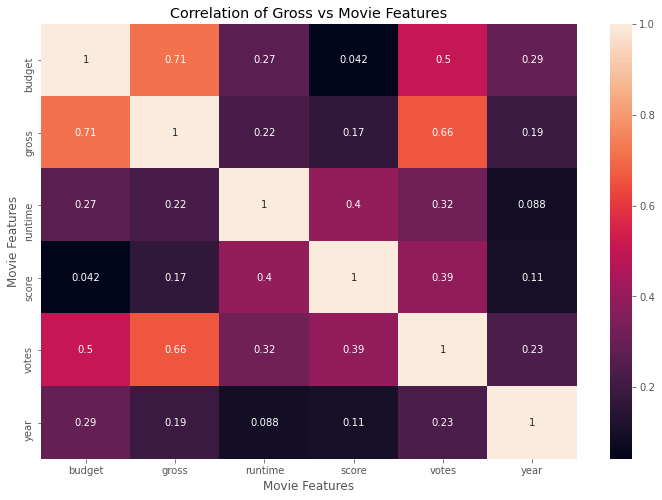

In [14]:
corr_matrix=df.corr(method='pearson')
sns.heatmap(corr_matrix, annot=True) #annot=True to see the values.
plt.title("Correlation of Gross vs Movie Features")
plt.xlabel("Movie Features")
plt.ylabel("Movie Features")
plt.show() #plt.show() is not a must in jupyter notebook but it's a must with matplotlib in other IDE's.

## <font color='green'> From the heatmap it is clear that Budget and votes have a very high positive correlation with the gross income.</font>
## <font color='green'>Budget- 0.71, Votes- 0.66 </font>

### In addition to the numeric values showing the correlation, let's do Bivariate plots to showcase the graphical relations using Matplotlib scatterplot

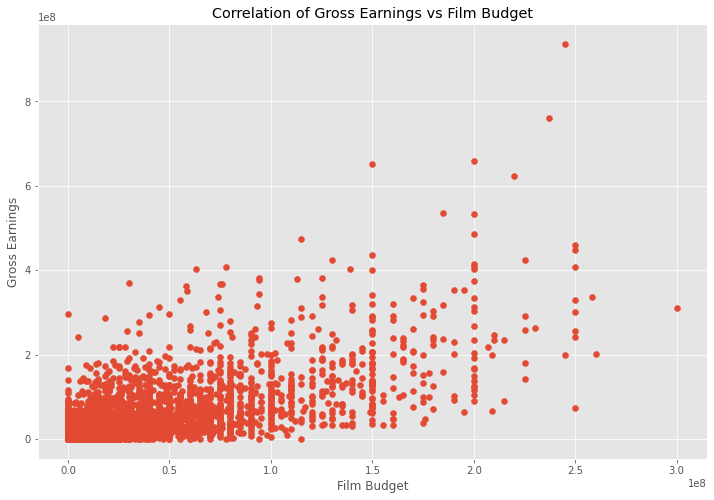

In [15]:
plt.scatter(x='budget',y='gross',data=df)
plt.title("Correlation of Gross Earnings vs Film Budget")
plt.xlabel("Film Budget")
plt.ylabel("Gross Earnings")
plt.show()

### It's a little difficult to understand the relation by just looking at the plot ,so let's try using seaborn to plot the scatter plot with additional features. ie we will use <font color='red'>regplot - This method is used to plot data and a linear regression model fit.</font>

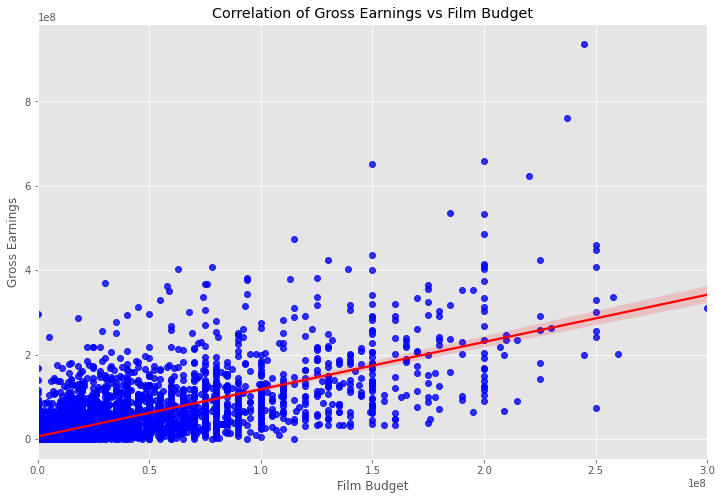

In [16]:
sns.regplot(x='budget',y='gross', data=df, scatter_kws={'color':'blue'}, line_kws={'color':'red'})
plt.title("Correlation of Gross Earnings vs Film Budget")
plt.xlabel("Film Budget")
plt.ylabel("Gross Earnings")
plt.show()

## <font color='green'> The bivariate analysis and the corr matrix together show that as Budget increases Gross Earnings also increase.</font>

## To understand the correlation of the categorical variables on the 'gross' column, we will convert all the categorical variables into numerical representations and Here specifaclly we are going to do the <font color='red'>'Label Encoding' using cat.codes</font>

In [17]:
df_numerized=df

for col in df_numerized.columns:
    if(df_numerized[col].dtype =='object'):#checking if the dtype is object
        df_numerized[col] = df_numerized[col].astype('category') #changing the 'object' dtype to 'category' for label encoding.
        df_numerized[col] =df_numerized[col].cat.codes # converting to numerical values using cat.codes

In [18]:
df_numerized.head()

,budget,company,country,director,genre,gross,name,rating,released,runtime,score,star,votes,writer,year,release_year
0,8000000,665,54,2192,1,52287414,4661,8,1986-08-22,89,8.1,2454,299174,3716,1986,1986
1,6000000,1680,54,1296,4,70136369,1821,7,1986-06-11,103,7.8,1605,264740,1970,1986,1986
2,15000000,1680,54,2645,0,179800601,6203,6,1986-05-16,110,6.9,2345,236909,1852,1986,1986
3,18500000,2062,54,1066,0,85160248,295,8,1986-07-18,137,8.4,2192,540152,1629,1986,1986
4,9000000,2122,54,2123,1,18564613,1872,6,1986-08-01,90,6.9,1139,36636,2549,1986,1986


## Understanding the effect of all features on the 'gross' column.

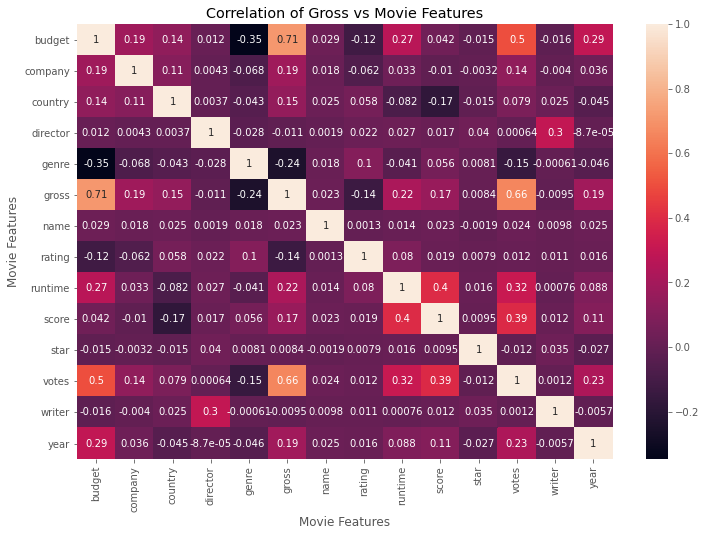

In [19]:
corr_matrix=df_numerized.corr(method='pearson')
sns.heatmap(corr_matrix, annot=True) #annot=True to see the values.
plt.title("Correlation of Gross vs Movie Features")
plt.xlabel("Movie Features")
plt.ylabel("Movie Features")
plt.show() #plt.show() is not a must in jupyter notebook but it's a must with matplotlib in other IDE's.

## The heatmap looks too crowded , so we will arrange the values column wise using unstack method.

In [23]:
corr_matrix=df_numerized.corr()
corr_pairs= corr_matrix.unstack()
corr_pairs

budget    budget      1.000000
          company     0.187205
          country     0.137635
          director    0.011602
          genre      -0.346794
          gross       0.712196
          name        0.028712
          rating     -0.119660
          runtime     0.268226
          score       0.042145
          star       -0.015062
          votes       0.503924
          writer     -0.015611
          year        0.291009
company   budget      0.187205
          company     1.000000
          country     0.107950
          director    0.004320
          genre      -0.068330
          gross       0.187220
          name        0.018098
          rating     -0.062250
          runtime     0.033058
          score      -0.010426
          star       -0.003160
          votes       0.138662
          writer     -0.004032
          year        0.036272
country   budget      0.137635
          company     0.107950
          country     1.000000
          director    0.003699
        

## Let's filter the above values to see at a go which columns have the highest corr with the 'gross' column.

In [26]:
high_corr=corr_pairs[(corr_pairs)>0.5]
high_corr

budget    budget      1.000000
          gross       0.712196
          votes       0.503924
company   company     1.000000
country   country     1.000000
director  director    1.000000
genre     genre       1.000000
gross     budget      0.712196
          gross       1.000000
          votes       0.662457
name      name        1.000000
rating    rating      1.000000
runtime   runtime     1.000000
score     score       1.000000
star      star        1.000000
votes     budget      0.503924
          gross       0.662457
          votes       1.000000
writer    writer      1.000000
year      year        1.000000
dtype: float64

# <font color='orange'>Thus it becomes clear that Votes and Budget are the two features that affect the Gross earnings of the movie highly with corr value>0.5.The company, country,runtime, score, year of release have nominal positive effect on the 'gross' earnings.The no of stars, name of movie, writer, director etc do not have any effect (almost 0 correlation).The rating, genre have a slight negative correlation on the 'gross' earnings of the movie.</font>